In [105]:
import pandas as pd
import numpy as np
import yfinance as yf
import plotly.express as px
import matplotlib
import matplotlib.pyplot as plt
import smtplib
from datetime import datetime, timedelta
from dateutil.relativedelta import *
from requests_html import HTMLSession
import sys, os
import io
import quandl as quandl 
from scipy.stats import pearsonr
from scipy.stats import spearmanr
from scipy.stats import chi2_contingency

In [2]:
final_df = pd.DataFrame()
start_date = '2006-01-01'
end_date = '2020-12-31'
api_string="44ErNV5zLdE6K7QpDWff"

def get_data(stock_code):
    start_time = datetime(2006, 1, 1, 0, 0) 
#     end_time = datetime.today()
    end_time = datetime(2020, 12, 31, 0, 0) 
    day_type = '1d'

    df = yf.download(stock_code,start=start_time,end=end_time,interval=day_type)            
    df = df.fillna(method='ffill')
    df['percent change'] = df['Adj Close'].pct_change()
    return df

# 1) Portfoilo DF

In [3]:
portfoilo_data = pd.read_excel('DATA INPUTS 2001 - 2021.xlsx')
portfoilo_data = portfoilo_data.set_index('Dates')
portfoilo_data = portfoilo_data.reindex(index=portfoilo_data.index[::-1])
portfoilo_data = portfoilo_data[(portfoilo_data.index > '2006-01-01') &
                                (portfoilo_data.index < '2020-12-31')]
display(portfoilo_data.head())

portfoilo_figure = px.line(portfoilo_data, x=portfoilo_data.index, y=['MSCI World Index','Goldman Commodity Index','US 5Y Treasury Futures'], title='Portfoilo Value')
portfoilo_figure.update_layout(hovermode="x")
portfoilo_figure.show()

portfoilo_data['MSCI World Index %'] = portfoilo_data['MSCI World Index'].pct_change()
portfoilo_data['Goldman Commodity Index %'] = portfoilo_data['Goldman Commodity Index'].pct_change()
portfoilo_data['US 5Y Treasury Futures %'] = portfoilo_data['US 5Y Treasury Futures'].pct_change()

portfoilo_figure2 = px.line(portfoilo_data, x=portfoilo_data.index, y=['MSCI World Index %','Goldman Commodity Index %','US 5Y Treasury Futures %'], title='Portfoilo Change')
portfoilo_figure2.update_layout(hovermode="x")
portfoilo_figure2.show()

print('MSCI World Index')
print(portfoilo_data['MSCI World Index'].describe())
print('')
print(portfoilo_data['MSCI World Index %'].describe())
print('')
print('********************')
print('')
print('Goldman Commodity Index')
print(portfoilo_data['Goldman Commodity Index'].describe())
print('')
print(portfoilo_data['Goldman Commodity Index %'].describe())
print('')
print('********************')
print('')
print('US 5Y Treasury Futures')
print(portfoilo_data['US 5Y Treasury Futures'].describe())
print('')
print(portfoilo_data['US 5Y Treasury Futures %'].describe())

final_df['MSCI World Index'] = portfoilo_data['MSCI World Index %']
final_df['Goldman Commodity Index'] = portfoilo_data['Goldman Commodity Index %']
final_df['US 5Y Treasury Futures'] = portfoilo_data['US 5Y Treasury Futures %']

,MSCI World Index,Goldman Commodity Index,US 5Y Treasury Futures
Dates,,,
2006-01-02,1259.11,431.7214,79.625000
2006-01-03,1281.30,438.1793,79.828125
2006-01-04,1295.12,438.5544,79.921875
2006-01-05,1295.40,432.1028,79.906250
2006-01-06,1308.15,437.9121,79.765625


MSCI World Index
count    3913.000000
mean     1596.409959
std       391.914048
min       688.640000
25%      1302.630000
50%      1584.090000
75%      1842.630000
max      2686.060000
Name: MSCI World Index, dtype: float64

count    3912.000000
mean        0.000251
std         0.010724
min        -0.099151
25%        -0.003727
50%         0.000668
75%         0.005037
max         0.095229
Name: MSCI World Index %, dtype: float64

********************

Goldman Commodity Index
count    3913.000000
mean      497.601412
std       125.320889
min       228.243900
25%       400.024300
50%       465.868000
75%       623.200000
max       890.294000
Name: Goldman Commodity Index, dtype: float64

count    3912.000000
mean        0.000093
std         0.014622
min        -0.117704
25%        -0.006909
50%         0.000211
75%         0.007510
max         0.079857
Name: Goldman Commodity Index %, dtype: float64

********************

US 5Y Treasury Futures
count    3913.000000
mean      106.947868


# 2) Risk Indicator

## 2.1) Gold

In [4]:
gold_data = pd.read_csv('XAU_USD Historical Data.csv')
gold_data['Date'] = pd.to_datetime(gold_data['Date'])
gold_data = gold_data.set_index('Date').sort_index()
# gold_data = gold_data.reindex(index=gold_data.index[::-1])
gold_data['percent change'] = pd.to_numeric(gold_data['Change %'].str.replace('%',''))
display(gold_data.head())

gold_figure = px.line(gold_data, x=gold_data.index, y="Price", title='Gold Value')
gold_figure.update_layout(hovermode="x")
gold_figure.show()

gold_figure2 = px.line(gold_data, x=gold_data.index, y="percent change", title='Gold Change')
gold_figure2.update_layout(hovermode="x")
gold_figure2.show()

print(gold_data['Price'].describe())
print(gold_data['percent change'].describe())

final_df['Gold'] = gold_data['percent change']

,Price,Open,High,Low,Change %,percent change
Date,,,,,,
2006-01-03,533.60,517.15,533.60,533.60,3.09%,3.09
2006-01-04,534.55,534.60,534.55,534.55,0.18%,0.18
2006-01-05,525.05,534.60,525.05,525.05,-1.78%,-1.78
2006-01-06,539.65,525.35,539.65,539.65,2.78%,2.78
2006-01-09,549.12,539.38,549.12,549.12,1.75%,1.75


count         3907
unique        3680
top       1,287.30
freq             3
Name: Price, dtype: object
count    3907.000000
mean        0.039680
std         1.128901
min        -8.490000
25%        -0.510000
50%         0.040000
75%         0.630000
max        11.000000
Name: percent change, dtype: float64


## 2.2) VIX

In [5]:
VIX_data = get_data('^VIX')
display(VIX_data.head())

vix_figure = px.line(VIX_data, x=VIX_data.index, y="Adj Close", title='VIX Value')
vix_figure.update_layout(hovermode="x")
vix_figure.show()

vix_figure2 = px.line(VIX_data, x=VIX_data.index, y="percent change", title='VIX Change')
vix_figure2.update_layout(hovermode="x")
vix_figure2.show()

print(VIX_data['Adj Close'].describe())
print(VIX_data['percent change'].describe())

final_df['VIX'] = VIX_data['percent change']

[*********************100%***********************]  1 of 1 completed


,Open,High,Low,Close,Adj Close,Volume,percent change
Date,,,,,,,
2006-01-03,12.25,12.51,10.99,11.14,11.14,0,NaN
2006-01-04,11.22,11.71,10.97,11.37,11.37,0,0.020646
2006-01-05,11.43,11.84,11.31,11.31,11.31,0,-0.005277
2006-01-06,11.23,11.50,10.81,11.00,11.00,0,-0.027409
2006-01-09,11.35,11.35,10.98,11.13,11.13,0,0.011818


count    3775.000000
mean       19.500540
std         9.614131
min         9.140000
25%        13.230000
50%        16.540001
75%        22.639999
max        82.690002
Name: Adj Close, dtype: float64
count    3774.000000
mean        0.003190
std         0.080593
min        -0.295727
25%        -0.041389
50%        -0.005712
75%         0.035030
max         1.155979
Name: percent change, dtype: float64


## 2.3) 10-Year Treasury Constant Maturity Minus 2-Year Treasury Constant Maturity

https://ycharts.com/indicators/10_2_year_treasury_yield_spread

In [38]:
Treasury_Data = pd.read_excel("T10Y2Y.xls")
Treasury_Data = Treasury_Data.set_index('observation_date')
Treasury_Data['percent change'] = Treasury_Data['T10Y2Y'].pct_change()
Treasury_Data = Treasury_Data[(Treasury_Data.index > '2006-01-01') &
                              (Treasury_Data.index < '2020-12-31')]
display(Treasury_Data)

treasury_figure = px.line(Treasury_Data, x=Treasury_Data.index, y="T10Y2Y", title='Treasury Value')
treasury_figure.update_layout(hovermode="x")
treasury_figure.show()

treasury_figure2 = px.line(Treasury_Data, x=Treasury_Data.index, y="percent change", title='Treasury Change')
treasury_figure2.update_layout(hovermode="x")
treasury_figure2.show()

print(Treasury_Data['T10Y2Y'].describe())
print(Treasury_Data['percent change'].describe())

final_df['T10Y2Y'] = Treasury_Data['percent change']

,T10Y2Y,percent change
observation_date,,
2006-01-02,NaN,0.000000
2006-01-03,0.03,-2.500000
2006-01-04,0.05,0.666667
2006-01-05,0.04,-0.200000
2006-01-06,0.02,-0.500000
...,...,...
2020-12-24,0.81,-0.024096
2020-12-25,NaN,0.000000
2020-12-28,0.81,0.000000


count    3753.00000
mean        1.27631
std         0.88244
min        -0.19000
25%         0.47000
50%         1.34000
75%         1.98000
max         2.91000
Name: T10Y2Y, dtype: float64
count    3910.000000
mean             NaN
std              NaN
min             -inf
25%        -0.019093
50%         0.000000
75%         0.018112
max              inf
Name: percent change, dtype: float64


## 2.4)  United States Misery Index

In [7]:
misery_data = quandl.get("USMISERY/INDEX", api_key=api_string, start_date=start_date, end_date=end_date)

In [8]:
misery_data['percent change'] = misery_data['Misery Index'].pct_change()
misery_data.index = pd.to_datetime(misery_data.index)
display(misery_data.head())

misery_figure = px.line(misery_data, x=misery_data.index, y="Misery Index", title='Misery Value')
misery_figure.update_layout(hovermode="x")
misery_figure.show()

misery_figure2 = px.line(misery_data, x=misery_data.index, y="percent change", title='Misery Change')
misery_figure2.update_layout(hovermode="x")
misery_figure2.show()

print(misery_data['Misery Index'].describe())
print(misery_data['percent change'].describe())

final_df['Misery Index'] = misery_data['percent change']

,Unemployment Rate,Inflation Rate,Misery Index,percent change
Date,,,,
2006-01-31,4.7,3.99,8.69,NaN
2006-02-28,4.8,3.60,8.40,-0.033372
2006-03-31,4.7,3.36,8.06,-0.040476
2006-04-30,4.7,3.55,8.25,0.023573
2006-05-31,4.6,4.17,8.77,0.063030


count    176.000000
mean       8.213750
std        2.235391
min        5.060000
25%        6.285000
50%        8.075000
75%        9.710000
max       15.030000
Name: Misery Index, dtype: float64
count    175.000000
mean       0.004948
std        0.130958
min       -0.276453
25%       -0.037495
50%       -0.002911
75%        0.031004
max        1.530303
Name: percent change, dtype: float64


## 2.5) US High Yield Corporate Bond Index OAS

In [9]:
corporate_data = quandl.get("ML/HYOAS", api_key = api_string, start_date=start_date, end_date=end_date)

In [39]:
# The risk-free rate we will use is the one-year Treasury bill rate
# Source: https://fred.stlouisfed.org/series/DGS1
rf = pd.read_excel('DGS1.xls')
rf = rf.set_index('observation_date')
rf = rf[(rf.index > '2006-01-01') & (rf.index < '2020-12-31')]

corporate_data['rf'] = rf
corporate_data['corporate - rf'] = corporate_data['BAMLH0A0HYM2'] - corporate_data['rf']

corporate_data['percent change'] = corporate_data['corporate - rf'].pct_change()

corporate_figure = px.line(corporate_data, x=corporate_data.index, y="corporate - rf", title='Corporate minus RF Value')
corporate_figure.update_layout(hovermode="x")
corporate_figure.show()

corporate_figure2 = px.line(corporate_data, x=corporate_data.index, y="percent change", title='Corporate minus RF Change')
corporate_figure2.update_layout(hovermode="x")
corporate_figure2.show()

display(corporate_data.head())

print(corporate_data['corporate - rf'].describe())
print(corporate_data['percent change'].describe())

final_df['US Corporate - RF'] = corporate_data['percent change']

,BAMLH0A0HYM2,rf,corporate - rf,percent change
DATE,,,,
2006-01-03,3.73,4.38,-0.65,NaN
2006-01-04,3.69,4.35,-0.66,0.015385
2006-01-05,3.64,4.36,-0.72,0.090909
2006-01-06,3.56,4.38,-0.82,0.138889
2006-01-09,3.51,4.39,-0.88,0.073171


count    3747.000000
mean        4.299741
std         3.708288
min        -2.580000
25%         2.160000
50%         4.500000
75%         5.860000
max        21.320000
Name: corporate - rf, dtype: float64
count    3914.000000
mean        0.003675
std         0.301723
min        -5.250000
25%        -0.012948
50%         0.000000
75%         0.011628
max        12.000000
Name: percent change, dtype: float64


# 3) Combination Data 2006-2020 Overview

In [46]:
display(final_df.corr())

fig1 = px.imshow(final_df.resample('1m').mean().corr(), 
                 labels=dict(color="Correlation"), 
                 width=1000, height=800,
                 color_continuous_scale=px.colors.sequential.matter)
fig1.show()

,MSCI World Index,Goldman Commodity Index,US 5Y Treasury Futures,Gold,VIX,T10Y2Y,Misery Index,US Corporate - RF
MSCI World Index,1.000000,0.477174,-0.347910,0.118865,-0.662364,0.015705,-0.071505,-0.046537
Goldman Commodity Index,0.477174,1.000000,-0.218120,0.288341,-0.283549,0.017264,0.202778,-0.030583
US 5Y Treasury Futures,-0.347910,-0.218120,1.000000,0.163404,0.295415,-0.033016,0.004736,0.057742
Gold,0.118865,0.288341,0.163404,1.000000,-0.015917,-0.042896,-0.090926,0.008435
VIX,-0.662364,-0.283549,0.295415,-0.015917,1.000000,-0.036487,0.036123,0.048494
T10Y2Y,0.015705,0.017264,-0.033016,-0.042896,-0.036487,1.000000,-0.004479,-0.000211
Misery Index,-0.071505,0.202778,0.004736,-0.090926,0.036123,-0.004479,1.000000,-0.113350
US Corporate - RF,-0.046537,-0.030583,0.057742,0.008435,0.048494,-0.000211,-0.113350,1.000000


# 4) Correlation Over The Years

MSCI World Index & Gold
Pearsonr Correlation


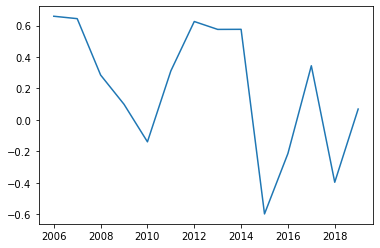

Spearman Correlation


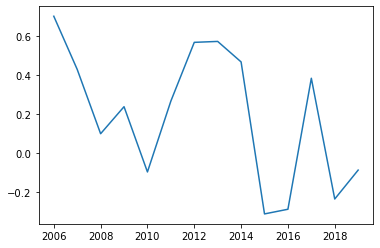

MSCI World Index & VIX
Pearsonr Correlation


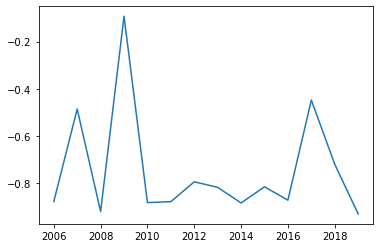

Spearman Correlation


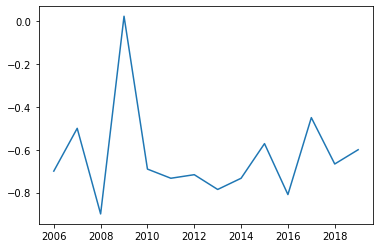

MSCI World Index & T10Y2Y
Pearsonr Correlation


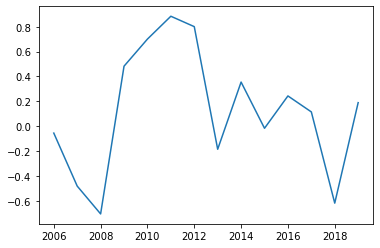

Spearman Correlation


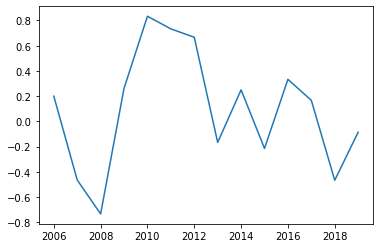

MSCI World Index & Misery Index
Pearsonr Correlation


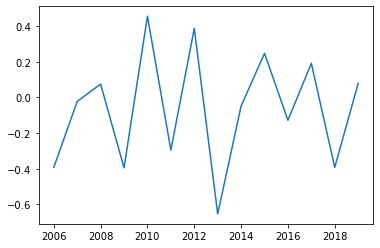

Spearman Correlation


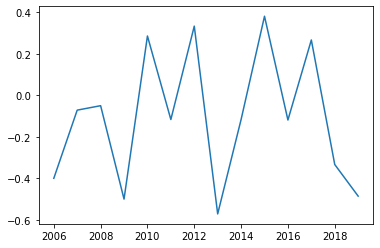

MSCI World Index & US Corporate - RF
Pearsonr Correlation


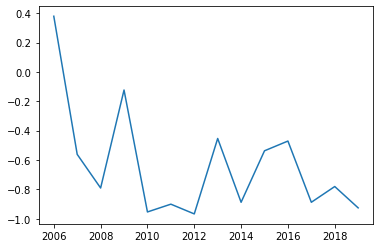

Spearman Correlation


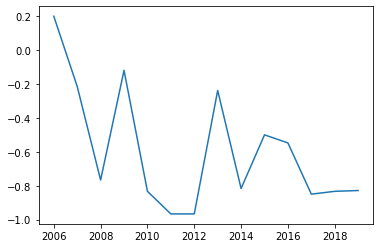

Goldman Commodity Index & Gold
Pearsonr Correlation


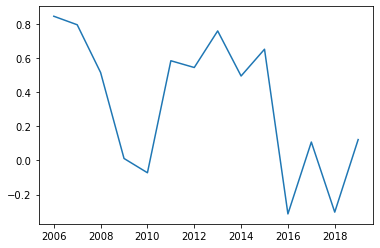

Spearman Correlation


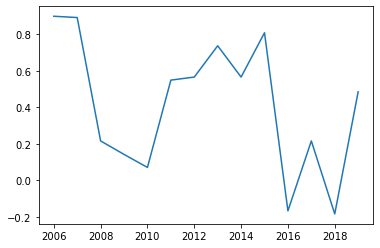

Goldman Commodity Index & VIX
Pearsonr Correlation


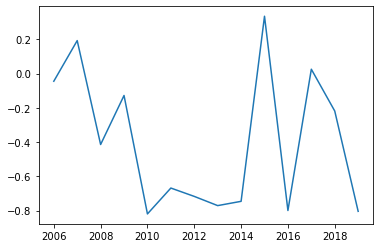

Spearman Correlation


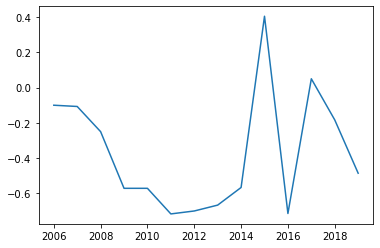

Goldman Commodity Index & T10Y2Y
Pearsonr Correlation


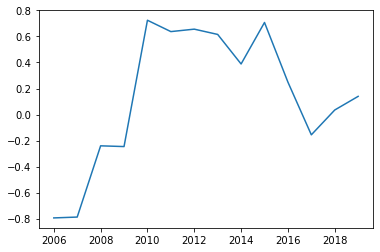

Spearman Correlation


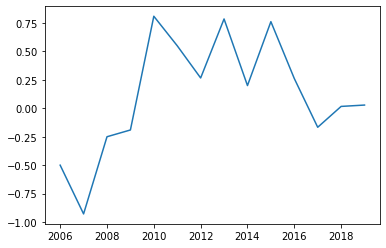

Goldman Commodity Index & Misery Index
Pearsonr Correlation


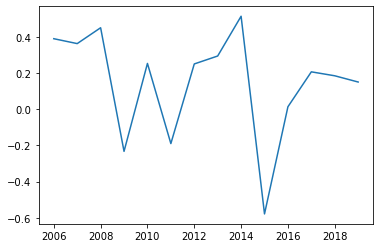

Spearman Correlation


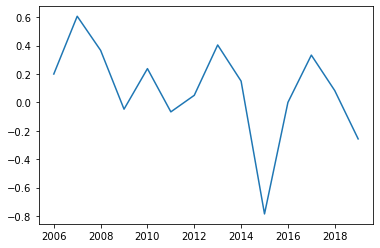

Goldman Commodity Index & US Corporate - RF
Pearsonr Correlation


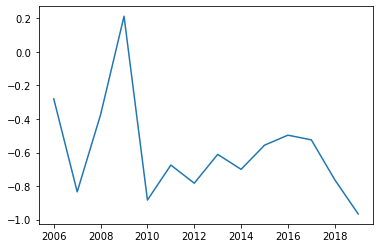

Spearman Correlation


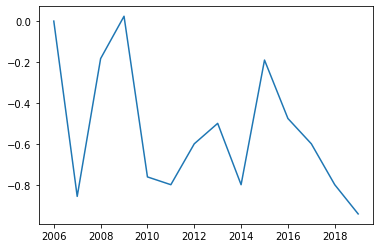

US 5Y Treasury Futures & Gold
Pearsonr Correlation


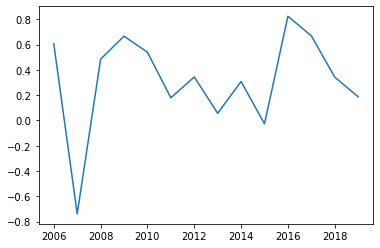

Spearman Correlation


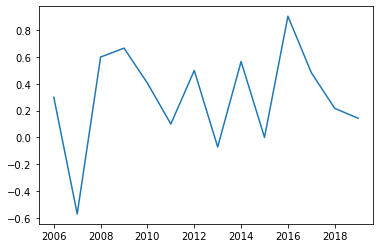

US 5Y Treasury Futures & VIX
Pearsonr Correlation


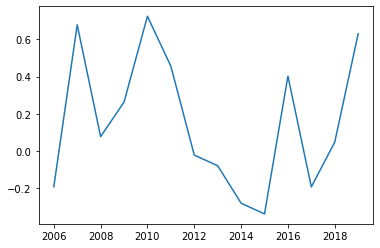

Spearman Correlation


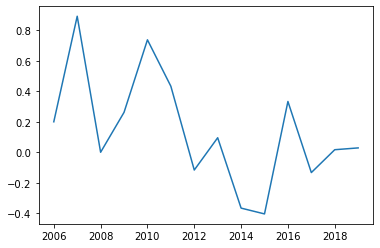

US 5Y Treasury Futures & T10Y2Y
Pearsonr Correlation


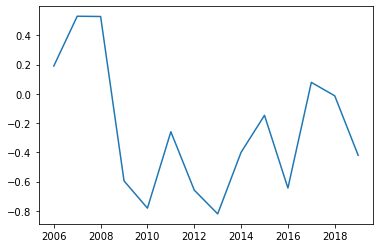

Spearman Correlation


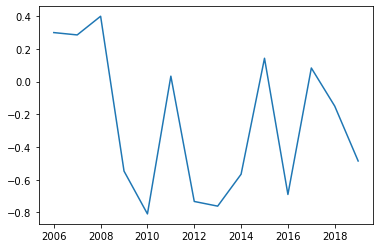

US 5Y Treasury Futures & Misery Index
Pearsonr Correlation


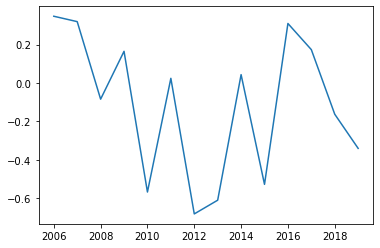

Spearman Correlation


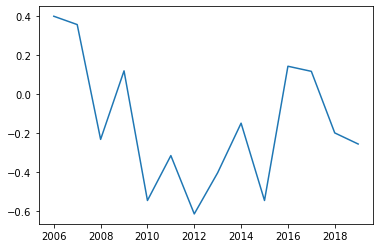

US 5Y Treasury Futures & US Corporate - RF
Pearsonr Correlation


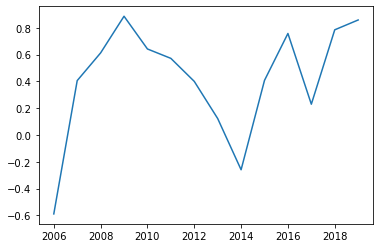

Spearman Correlation


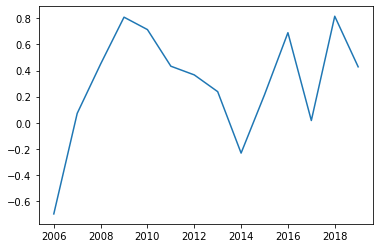

In [86]:
years = range(2006, 2020)
portfoilo = ['MSCI World Index','Goldman Commodity Index','US 5Y Treasury Futures']
risk_indicator= ['Gold','VIX','T10Y2Y','Misery Index','US Corporate - RF']
             
for product in portfoilo:
    for risk in risk_indicator: 
        spearman_correlation_list = []
        pearsonr_correlation_list = []
        
        for single_year in years:
            resample_data_year = final_df[final_df.index.year == single_year].resample('1m').mean()
            resample_data_year.replace([np.inf, -np.inf], np.nan, inplace=True)
            resample_data_year = resample_data_year.dropna()
            
            #Pearsonr - Check for linear relationship, same direction at constant rate
            pearsonr_data , _ = pearsonr(resample_data_year[product], resample_data_year[risk])
            pearsonr_correlation_list.append(pearsonr_data)
            
            #Spearman - Check for monotonic relationship, same direction different rate
            spearman_data , _ = spearmanr(resample_data_year[product], resample_data_year[risk])
            spearman_correlation_list.append(spearman_data)
                             
            #Chi-Square
#             table = [resample_data_year[product].values ** 2,
#                      resample_data_year[risk].values ** 2]
#             stat, p, dof, expected = chi2_contingency(table)
# #             print('dof=%d' % dof)
# #             print(expected)
#             # interpret test-statistic
#             prob = 0.95
#             critical = chi2.ppf(prob, dof)
#             print('probability=%.3f, critical=%.3f, stat=%.3f' % (prob, critical, stat))
#             if abs(stat) >= critical:
#                 print('Dependent (reject H0)')
#             else:
#                 print('Independent (fail to reject H0)')
                
#         print(spearman_correlation_list)
#         print(pearsonr_correlation_list)
        
        print(product + ' & ' + risk)
        print('Pearsonr Correlation')
        plt.figure(0)
        plt.plot(years,pearsonr_correlation_list)
        plt.show()
        
        print('Spearman Correlation')
        plt.figure(1)
        plt.plot(years,spearman_correlation_list)
        plt.show()
        


# 5) Machine Learning

In [92]:
#libraries for preprocessing
from sklearn import preprocessing
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
le = preprocessing.LabelEncoder()

#libraries for evaluation
from sklearn.metrics import mean_squared_log_error,r2_score,mean_squared_error
from sklearn.model_selection import train_test_split

#libraries for models
from sklearn.linear_model import LinearRegression

from sklearn.linear_model import Ridge
from sklearn.linear_model import LassoCV,RidgeCV
from yellowbrick.regressor import AlphaSelection

from sklearn.linear_model import Lasso

from sklearn.neighbors import KNeighborsRegressor

from sklearn.ensemble import RandomForestRegressor

from sklearn.ensemble import BaggingRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.svm import SVR

from sklearn.ensemble import AdaBoostRegressor

import xgboost as xgb

In [166]:
ml_data = final_df.resample('1m').mean()
ml_data.replace([np.inf, -np.inf], np.nan, inplace=True)
ml_data = ml_data.dropna()

portfoilo = ['MSCI World Index','Goldman Commodity Index','US 5Y Treasury Futures']
risk_indicator= ['Gold','VIX','T10Y2Y','Misery Index','US Corporate - RF']
             
feature_list_numerical =  ml_data[risk_indicator]
feature_list_target = ml_data[portfoilo[2]]

df = pd.concat([feature_list_numerical, feature_list_target], axis=1)

def normalize(df):
    result = df.copy()
    for feature_name in df.columns:
        max_value = df[feature_name].max()
        min_value = df[feature_name].min()
        result[feature_name] = (df[feature_name] - min_value) / (max_value - min_value)
    return result

df = normalize(df)

def trainingData(df,n):
    X = df.iloc[:,n]
    y = df.iloc[:,-1:].values.T
    y=y[0]
    X_train,X_test,y_train,y_test=train_test_split(X,y,train_size=0.9,test_size=0.1,random_state=0)
    return (X_train,X_test,y_train,y_test)

X_train,X_test,y_train,y_test=trainingData(df,list(range(len(list(df.columns))-1)))

def result(y_test,y_pred):
    r=[]
    r.append(mean_squared_log_error(y_test, y_pred))
    r.append(np.sqrt(r[0]))
    r.append(r2_score(y_test,y_pred))
    r.append(round(r2_score(y_test,y_pred)*100,4))
    return (r)

#dataframe that store the performance of each model
accu=pd.DataFrame(index=['MSLE', 'Root MSLE', 'R2 Score','Accuracy(%)'])

## 5.1) Linear Regression

In [167]:
#fitting model
LR=LinearRegression()
LR.fit(X_train,y_train)
y_pred=LR.predict(X_test)

#calculating error/accuracy
y_test_1,y_pred_1=y_test,y_pred
r1_lr=result(y_test_1,y_pred_1)
print('Coefficients: \n', LR.coef_)
print("MSLE : {}".format(r1_lr[0]))
print("Root MSLE : {}".format(r1_lr[1]))
print("R2 Score : {} or {}%".format(r1_lr[2],r1_lr[3]))
accu['Linear Regression']=r1_lr

Coefficients: 
 [ 0.35359988  0.1833133  -0.00607103 -0.06105071  0.32426653]
MSLE : 0.011207045911015477
Root MSLE : 0.1058633360092883
R2 Score : 0.29951240538992063 or 29.9512%


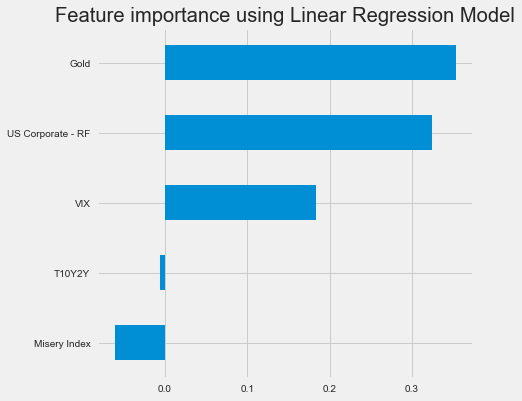

In [168]:
#Ploting feature importance graph
coef = pd.Series(LR.coef_, index = X_train.columns)
imp_coef = coef.sort_values()
matplotlib.rcParams['figure.figsize'] = (6.0, 6.0)
imp_coef.plot(kind = "barh")
plt.title("Feature importance using Linear Regression Model")
plt.savefig('Linear-Regression-Feature-Importance.jpg')
plt.show()

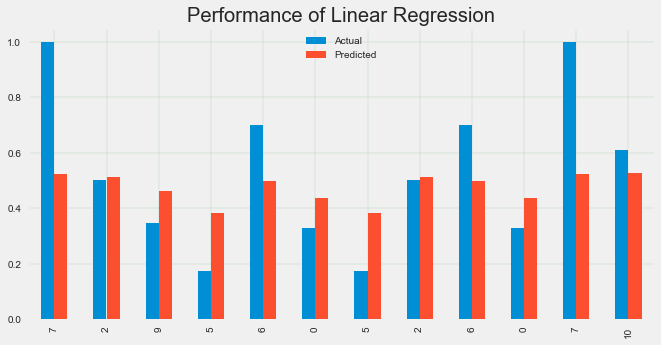

In [169]:
#Visualization of true value and predicted

df_check = pd.DataFrame({'Actual': y_test_1, 'Predicted': y_pred_1})
df_check = df_check.sample(frac=1, replace=True)
df_check.plot(kind='bar',figsize=(10,5))
plt.grid(which='major', linestyle='-', linewidth='0.1', color='Green')
plt.title('Performance of Linear Regression')
plt.savefig('Linear-Regression-Performance')
plt.show()

## 5.2) Ridge regression

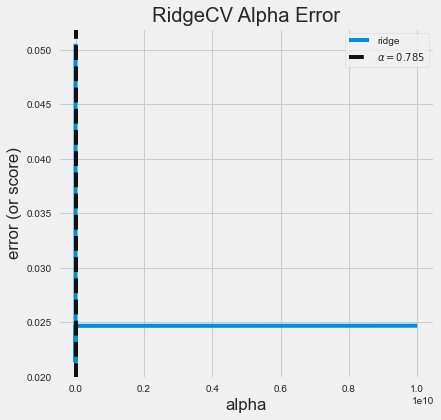

<AxesSubplot:title={'center':'RidgeCV Alpha Error'}, xlabel='alpha', ylabel='error (or score)'>

In [170]:
#predicting value of alpha

alphas = 10**np.linspace(10,-2,400)
model = RidgeCV(alphas=alphas)
visualizer = AlphaSelection(model)
visualizer.fit(X_train,y_train)
visualizer.show()

In [171]:
#model object and fitting model
RR=Ridge(alpha=20.336,solver='auto')
RR.fit(X_train,y_train)
y_pred=RR.predict(X_test)

#model evaluation

y_test_2,y_pred_2=y_test,y_pred
r2_ridge=result(y_test_2,y_pred_2)
print("MSLE : {}".format(r2_ridge[0]))
print("Root MSLE : {}".format(r2_ridge[1]))
print("R2 Score : {} or {}%".format(r2_ridge[2],r2_ridge[3]))
accu['Ridge Regression']=r2_ridge

MSLE : 0.01719579646573403
Root MSLE : 0.13113274368262884
R2 Score : -0.03430008452502564 or -3.43%


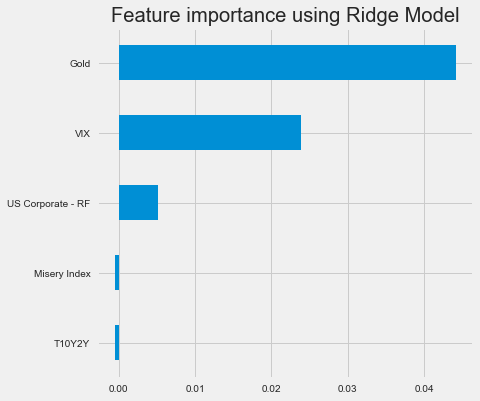

In [172]:
#Visualization of Feature Importance

coef = pd.Series(RR.coef_, index = X_train.columns)
imp_coef = coef.sort_values()
matplotlib.rcParams['figure.figsize'] = (6.0, 6.0)
imp_coef.plot(kind = "barh")
plt.title("Feature importance using Ridge Model")
plt.savefig('Ridge-Regression-Feature-Importance.jpg')
plt.show()

## 5.3) Lasso Regression

In [173]:
#model object and fitting it
lasso=Lasso(alpha=0.0001)
lasso.fit(X_train,y_train)
y_pred=lasso.predict(X_test)

In [174]:
#model evaluation
y_test_3,y_pred_3=y_test,y_pred
r3_lasso=result(y_test_3,y_pred_3)
print("MSLE : {}".format(r3_lasso[0]))
print("Root MSLE : {}".format(r3_lasso[1]))
print("R2 Score : {} or {}%".format(r3_lasso[2],r3_lasso[3]))
accu['Lasso Regression']=r3_lasso

MSLE : 0.01142069504059359
Root MSLE : 0.10686765198409474
R2 Score : 0.2863925766020742 or 28.6393%


## 5.4) KNN

In [175]:
#estimating MSLE for k=1-9
R_MSLE=[]
for i in range(1,10):
    KNN=KNeighborsRegressor(n_neighbors=i)
    KNN.fit(X_train,y_train)
    y_pred=KNN.predict(X_test)
    error=np.sqrt(mean_squared_log_error(y_test, y_pred))
    R_MSLE.append(error)
    print("K =",i," , Root MSLE =",error)

K = 1  , Root MSLE = 0.1610274424495648
K = 2  , Root MSLE = 0.1064287264359272
K = 3  , Root MSLE = 0.11095032113794412
K = 4  , Root MSLE = 0.10554776920291957
K = 5  , Root MSLE = 0.1059164790428836
K = 6  , Root MSLE = 0.11115897631969658
K = 7  , Root MSLE = 0.11261327813026824
K = 8  , Root MSLE = 0.11254297826684997
K = 9  , Root MSLE = 0.11705213545068173


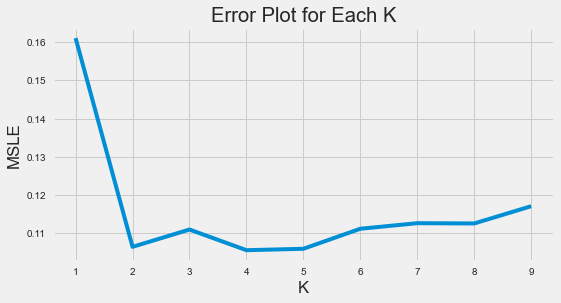

In [176]:
#plotting error
curve = pd.DataFrame(R_MSLE) #elbow curve 
plt.figure(figsize=(8,4))
plt.xticks(list(range(1,10)), list(range(1,10)), rotation='horizontal')
plt.plot(list(range(1,10)),R_MSLE)
plt.xlabel('K')
plt.ylabel('MSLE')
plt.title('Error Plot for Each K')
plt.savefig('KNN-Error-Plot.jpg')
plt.show()

In [177]:
#model implementation
KNN=KNeighborsRegressor(n_neighbors=2) 
KNN.fit(X_train,y_train)
y_pred=KNN.predict(X_test)

#model evaluation
r4_knn=result(y_test,y_pred)
print("MSLE : {}".format(r4_knn[0]))
print("Root MSLE : {}".format(r4_knn[1]))
print("R2 Score : {} or {}%".format(r4_knn[2],r4_knn[3]))
accu['KNN']=r4_knn

accu.to_csv('errors.csv')

MSLE : 0.011327073810773428
Root MSLE : 0.1064287264359272
R2 Score : 0.28153803086755647 or 28.1538%


## 5.5) Random Forest

In [178]:
RFR = RandomForestRegressor(n_estimators=180,random_state=0, min_samples_leaf=1, max_features=0.5, n_jobs=-1, oob_score=True)
RFR.fit(X_train,y_train)
y_pred = RFR.predict(X_test)

In [179]:
r5_rf=result(y_test,y_pred)
print("MSLE : {}".format(r5_rf[0]))
print("Root MSLE : {}".format(r5_rf[1]))
print("R2 Score : {} or {}%".format(r5_rf[2],r5_rf[3]))
accu['RandomForest Regressor']=r5_rf

MSLE : 0.00880589735246029
Root MSLE : 0.09383974292622657
R2 Score : 0.4203484282612714 or 42.0348%


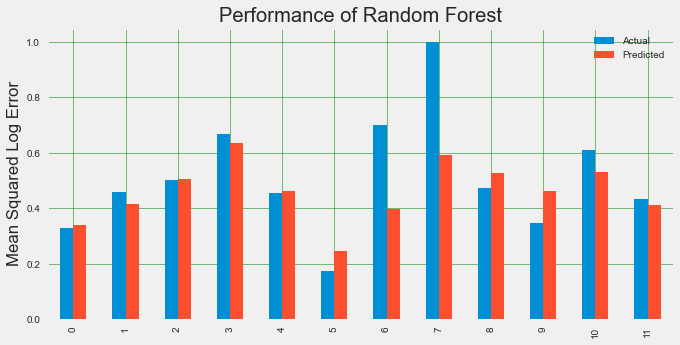

In [180]:
df_check = pd.DataFrame({'Actual': y_test, 'Predicted': y_pred})
df_check = df_check.head(25)
#round(df_check,2)
df_check.plot(kind='bar',figsize=(10,5))
plt.grid(which='major', linestyle='-', linewidth='0.5', color='green')
plt.title('Performance of Random Forest')
plt.ylabel('Mean Squared Log Error')
plt.savefig('Random-Forest-Performance.jpg')
plt.show()

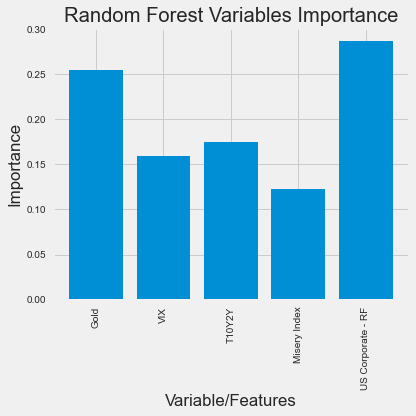

In [181]:
importances=RFR.feature_importances_
features=X_train.columns

# Set the style
plt.style.use('fivethirtyeight')
# list of x locations for plotting
x_values = list(range(len(importances)))
# Make a bar chart
plt.figure(figsize=(6,6))
plt.bar(x_values, importances, orientation = ('vertical'))
# Tick labels for x axis
plt.xticks(x_values, features, rotation=(90))
# Axis labels and title
plt.ylabel('Importance'); 
plt.xlabel('Variable/Features'); 
plt.title('Random Forest Variables Importance')
plt.tight_layout()
plt.savefig('Random-Forest-Variables-Importances.jpg',dpi=600)
plt.show();

## 5.6) Bagging Regressor

In [182]:
#model implementation
baggReg=BaggingRegressor(base_estimator=DecisionTreeRegressor(max_depth=20),n_estimators=50, random_state=1,
                         max_samples=1.0, max_features=1.0, bootstrap=False, 
                         bootstrap_features=False, oob_score=False, warm_start=False, n_jobs=-1, verbose=0)
baggReg.fit(X_train,y_train)
y_pred=baggReg.predict(X_test)

In [183]:
#model evaluation
r6_br=result(y_test,y_pred)
print("MSLE : {}".format(r6_br[0]))
print("Root MSLE : {}".format(r6_br[1]))
print("R2 Score : {} or {}%".format(r6_br[2],r6_br[3]))

MSLE : 0.008078367761710843
Root MSLE : 0.08987974055208907
R2 Score : 0.5410893558877641 or 54.1089%


http://www.fairlynerdy.com/what-is-r-squared/

In [184]:
accu['Bagging Regressor']=r6_br
accu.to_csv('errors.csv')

## 5.7) Adaboost

In [185]:
#model implementation
ABR = AdaBoostRegressor(
    DecisionTreeRegressor(max_depth=24),
    n_estimators=200,learning_rate=0.6
)

ABR.fit(X_train, y_train)
y_pred = ABR.predict(X_test)

#model evaluation
r7_ab=result(y_test,y_pred)
print("MSLE : {}".format(r7_ab[0]))
print("Root MSLE : {}".format(r7_ab[1]))
print("R2 Score : {} or {}%".format(r7_ab[2],r7_ab[3]))

MSLE : 0.007968501062441756
Root MSLE : 0.08926646101667611
R2 Score : 0.500313477035857 or 50.0313%


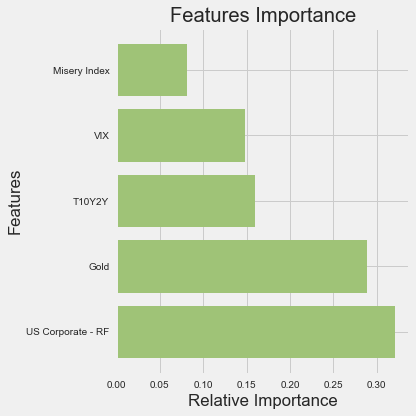

In [186]:
importances=ABR.feature_importances_
features=X_train.columns

indices = np.argsort(importances)
indices = [x for x in reversed(indices)]
plt.figure(1)
plt.title('Features Importance')
plt.barh(range(len(indices)), importances[indices], color='g', align='center')
plt.yticks(range(len(indices)), features[indices])
plt.xlabel('Relative Importance')
plt.ylabel('Features')
plt.tight_layout()
plt.savefig('Adaboost-Features-Importance2.jpg',dpi=60)
plt.show();

In [187]:
accu['AdaBoost Regressor']=r7_ab
accu.to_csv('errors.csv')

## 5.8) XGboost

In [188]:
# model implementation and fitting data
xg_reg = xgb.XGBRegressor(objective ='reg:squarederror', learning_rate = 0.4,
                max_depth = 24, alpha = 5, n_estimators = 200)
xg_reg.fit(X_train,y_train)
y_pred = xg_reg.predict(X_test)

y_test_1,y_pred_1=y_test,y_pred
r8_xg=result(y_test_1,y_pred_1)
print("MSLE : {}".format(r8_xg[0]))
print("Root MSLE : {}".format(r8_xg[1]))
print("R2 Score : {} or {}%".format(r8_xg[2],r8_xg[3]))

MSLE : 0.016539615182911877
Root MSLE : 0.12860643523133622
R2 Score : 0.022320200701047788 or 2.232%


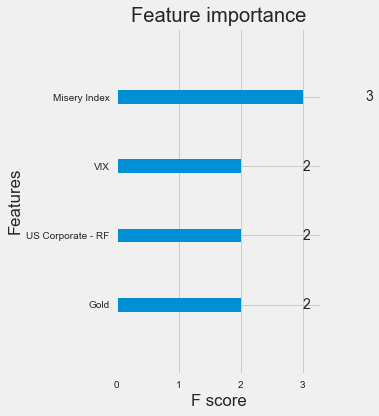

In [189]:
xgb.plot_importance(xg_reg)
plt.rcParams['figure.figsize'] = [5, 5]
plt.tight_layout()
plt.savefig('XGBoost-Features-Importance.jpg')
plt.show();

# 6) Result

In [190]:
accu=pd.read_csv('./errors.csv',index_col=0)
accu

,Linear Regression,Ridge Regression,Lasso Regression,KNN,RandomForest Regressor,Bagging Regressor,AdaBoost Regressor
MSLE,0.011207,0.017196,0.011421,0.011327,0.008806,0.008078,0.007969
Root MSLE,0.105863,0.131133,0.106868,0.106429,0.093840,0.089880,0.089266
R2 Score,0.299512,-0.034300,0.286393,0.281538,0.420348,0.541089,0.500313
Accuracy(%),29.951200,-3.430000,28.639300,28.153800,42.034800,54.108900,50.031300


In [191]:
model_accuracy=accu.loc['Accuracy(%)']

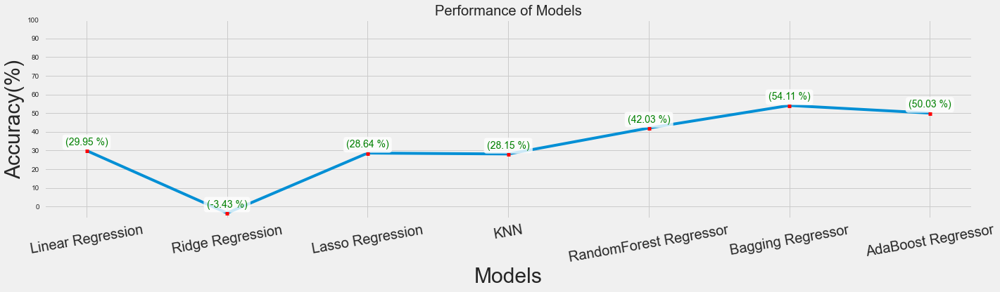

In [192]:
x=list(range(len(model_accuracy)))
y=list(range(0,101,10))
props = dict(boxstyle='round', facecolor='white', alpha=0.8)
plt.figure(figsize=(20,6))
plt.plot(model_accuracy)
plt.yticks(y)
plt.xticks(fontsize=20)
plt.xticks(rotation = (10))
plt.xlabel("Models",fontsize=30)
plt.ylabel("Accuracy(%)",fontsize=30)
plt.title("Performance of Models")
for a,b in zip(x,y):
    b=model_accuracy[a]
    val="("+str(round(model_accuracy[a],2))+" %)"
    plt.text(a, b+4.5, val,horizontalalignment='center',verticalalignment='center',color='green',bbox=props)
    plt.text(a, b+3.5, '.',horizontalalignment='center',verticalalignment='center',color='red',fontsize=50)
plt.tight_layout()
plt.savefig('Overall-Performance.jpg',dpi=600)
plt.show();